# II. VISUALISING SINGAPORE'S WEATHER PATTERNS: 1983 - 2019
The lack of seasonal variations lull many into thinking that Singapore's weather is predictable and unchanging. Nothing is further from the truth, with climate change making the city state's weather even more unpredictable.

We are beginning to feel the impact of warmer days and more intense storms. At the ground-level, it feels as if Singapore is getting much warmer at an earlier hour. On many days, the 8am sun that greets me upon stepping out feels more like something I would expect in the late morning. The mid-afternoon blaze has never felt more intense. 

In this project, I'll attempt to illustrate the changing weather patterns in Singapore using classic as well as new visualisation libraries/techniques like Plotly Express.

It's hard to find detailed and publicly available datasets going back decades in Singapore. This weather dataset is one of the rare ones, available via the Met Service's [website](http://www.weather.gov.sg/climate-historical-daily), and has been one of my favourite local data sets since I began my data science journey.

In [2]:
import joypy
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly
import plotly_express as px
import plotly.graph_objects as go
import plotly.offline as py
import seaborn as sns

from datetime import datetime
from matplotlib import cm

py.init_notebook_mode(connected=False)
mpl.rcParams["figure.dpi"] = 300
%matplotlib inline
%config InlineBackend.figure_format ='retina'

# 1. DATASETS
For this series of visualilsations, I'll be using four tables from two sources.

The first is a set of daily records from the Met Service's website, from Jan 01 1983 to June 30 2019.

The second, third and fourth tables are monthly aggregate weather data from the government's [data agency](https://data.gov.sg/group/environment). While the daily records go back to 1980, those between 1980 and 1982 are mostly incomplete. For consistency's sake, I've set the common start point for all four tables at 1983.

Pre-processing of these four datasets were dealt with in the earlier notebook 1.0_data_cleaning_cch. Let's load them up, and take a quick look at the key highlights of the datasets.

## 1.1 Dataset 01: Daily weather records from Jan 01 1983 to June 30 2019 

In [3]:
weather = pd.read_csv('../data/weather.csv')

In [4]:
weather.head()

,Date,Year,Month,Day,Daily Rainfall Total (mm),Mean Temperature (°C),Maximum Temperature (°C),Minimum Temperature (°C),Mean Wind Speed (km/h),Max Wind Speed (km/h)
0,2019-06-30,2019,6,30,0.0,28.8,30.9,27.3,10.1,28.8
1,2019-06-29,2019,6,29,18.4,28.6,32.0,23.9,13.0,41.8
2,2019-06-28,2019,6,28,0.0,29.6,32.2,27.8,14.4,33.5
3,2019-06-27,2019,6,27,0.0,29.2,32.2,26.7,9.7,34.2
4,2019-06-26,2019,6,26,0.0,28.3,31.2,27.1,8.6,43.2


In [5]:
weather.describe()

,Year,Month,Day,Daily Rainfall Total (mm),Mean Temperature (°C),Maximum Temperature (°C),Minimum Temperature (°C),Mean Wind Speed (km/h),Max Wind Speed (km/h)
count,13330.000000,13330.000000,13330.000000,13330.000000,13330.000000,13330.000000,13330.000000,13330.000000,13330.000000
mean,2000.750863,6.481995,15.727907,5.851905,27.657524,31.510833,24.889070,7.402755,34.041722
std,10.537707,3.448823,8.799558,14.455764,1.173196,1.571750,1.260053,3.442466,8.052888
min,1983.000000,1.000000,1.000000,0.000000,22.800000,23.600000,20.200000,0.200000,4.700000
25%,1992.000000,3.000000,8.000000,0.000000,26.900000,30.800000,24.000000,4.800000,28.800000
50%,2001.000000,6.000000,16.000000,0.000000,27.700000,31.700000,24.900000,6.800000,33.100000
75%,2010.000000,9.000000,23.000000,4.400000,28.500000,32.500000,25.700000,9.700000,38.200000
max,2019.000000,12.000000,31.000000,216.200000,30.900000,36.000000,29.100000,22.200000,90.700000


## 1.2 Dataset 02: Monthly Maximum Recorded Temperature; Jan 1983 to June 2019 

In [6]:
temp_max = pd.read_csv('../data/max_temp_monthly.csv')

In [7]:
temp_max.head()

,Max_Monthly_Temperature (°C),Year,Month
0,32.1,1983,1
1,34.6,1983,2
2,35.8,1983,3
3,35.8,1983,4
4,34.0,1983,5


In [8]:
temp_max.describe()

,Max_Monthly_Temperature (°C),Year,Month
count,438.000000,438.000000,438.000000
mean,33.372831,2000.753425,6.458904
std,0.822519,10.550670,3.455755
min,31.300000,1983.000000,1.000000
25%,32.800000,1992.000000,3.000000
50%,33.300000,2001.000000,6.000000
75%,33.900000,2010.000000,9.000000
max,36.000000,2019.000000,12.000000


## 1.3 Dataset 03: Monthly Mean Recorded Temperature; Jan 1983 to June 2019

In [9]:
temp_mean = pd.read_csv('../data/mean_temp_monthly.csv')

In [10]:
temp_mean.head()

,Mean_Monthly_Temperature (°C),Year,Month
0,26.5,1983,1
1,28.1,1983,2
2,28.9,1983,3
3,29.4,1983,4
4,28.3,1983,5


In [11]:
temp_mean.describe()

,Mean_Monthly_Temperature (°C),Year,Month
count,438.000000,438.000000,438.000000
mean,27.655251,2000.753425,6.458904
std,0.804170,10.550670,3.455755
min,25.400000,1983.000000,1.000000
25%,27.100000,1992.000000,3.000000
50%,27.700000,2001.000000,6.000000
75%,28.300000,2010.000000,9.000000
max,29.500000,2019.000000,12.000000


## 1.4 Dataset 04: Monthly Total Recorded Rainfall; Jan 1983 to June 2019

In [12]:
monthly_rain = pd.read_csv('../data/rain_monthly.csv')

In [13]:
monthly_rain.head()

,Total_Monthly_Rainfall (mm),Year,Month
0,246.0,1983,1
1,5.6,1983,2
2,18.6,1983,3
3,33.6,1983,4
4,160.8,1983,5


In [14]:
monthly_rain.describe()

,Total_Monthly_Rainfall (mm),Year,Month
count,438.000000,438.000000,438.000000
mean,178.350457,2000.753425,6.458904
std,112.684336,10.550670,3.455755
min,0.200000,1983.000000,1.000000
25%,94.050000,1992.000000,3.000000
50%,160.100000,2001.000000,6.000000
75%,239.950000,2010.000000,9.000000
max,765.900000,2019.000000,12.000000


# 2. THE HEAT IS ON - VISUALISING DAILY AND MONTHLY TEMPERATURE RECORDS
According to [Singapore’s National Climate Change Secretariat](https://www.nccs.gov.sg/climate-change-and-singapore/national-circumstances/impact-of-climate-change-on-singapore), the country’s annual mean temperatures rose at an average rate of 0.25°C per decade from 1948 to 2016. 

The agency projects daily mean temperatures to rise by 1.4°C to 4.6°C in the future, and more warm days-nights from February to September through the rest of this century. 

## 2.1 Changes in daily temperatures: Maximum, minimum, and mean recorded temperatures from 1983 - 2019
I'll start with the classic Seaborn library. Static charts may not excite too many people these days, but I love how the clean, crisp graphs convey information clearly with just one glance.

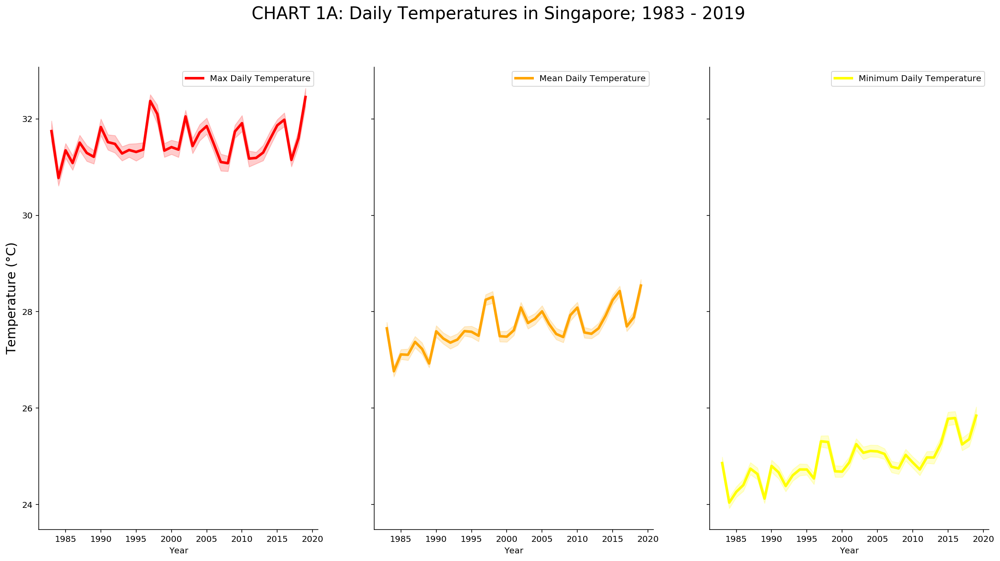

In [57]:
fig, axs = plt.subplots(1, 3, figsize=(20, 10), sharey=True)
sns.lineplot(
    x="Year",
    y="Maximum Temperature (°C)",
    linewidth=3,
    data=weather,
    label="Max Daily Temperature",
    color="red",
    ax=axs[0],
)
sns.lineplot(
    x="Year",
    y="Mean Temperature (°C)",
    linewidth=3,
    data=weather,
    label="Mean Daily Temperature",
    color="orange",
    ax=axs[1],
)
sns.lineplot(
    x="Year",
    y="Minimum Temperature (°C)",
    linewidth=3,
    data=weather,
    label="Minimum Daily Temperature",
    color="yellow",
    ax=axs[2],
)
fig.suptitle("CHART 1A: Daily Temperatures in Singapore; 1983 - 2019", fontsize=20)
axs[0].set_ylabel("Temperature (°C)", fontsize=15)
sns.despine()
plt.show()

### Whichever way you look at it, it's getting warmer in Singapore
The trend lines for maximum, minimum, and mean recorded temperatures are all pointing upwards. But details are often lost in line plots, especially when grouped next to each other.

Box plots can be useful in this context, giving us insights into the distribution of the median values over the years and where the outliers are.

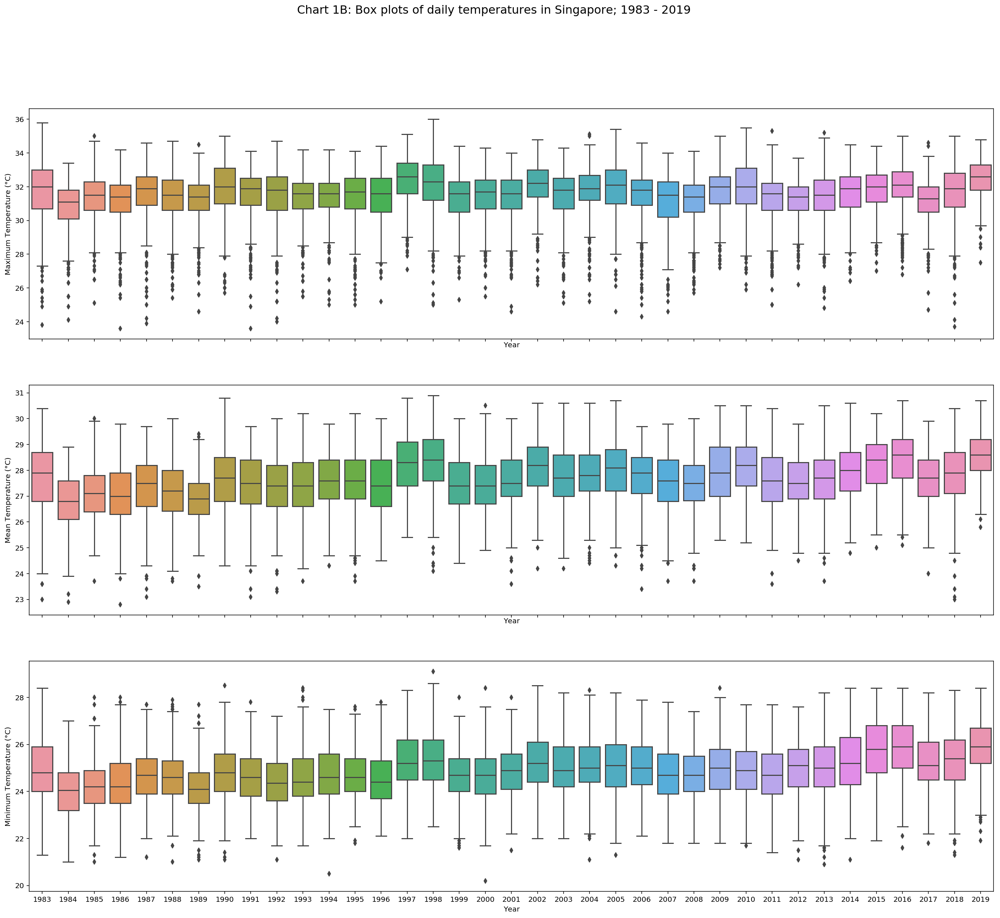

In [59]:
fig, axs = plt.subplots(3, 1, figsize=(24, 20), sharex=True)
sns.boxplot(y="Maximum Temperature (°C)", x="Year", data=weather, ax=axs[0])
sns.boxplot(y="Mean Temperature (°C)", x="Year", data=weather, ax=axs[1])
sns.boxplot(y="Minimum Temperature (°C)", x="Year", data=weather, ax=axs[2])
fig.suptitle(
    "Chart 1B: Box plots of daily temperatures in Singapore; 1983 - 2019 ", fontsize=16
)
plt.show()

The horizontal lines at the end of each box (or the "whiskers") refer to the respective minimum and maximum values that year, while the line in the centre refers to the median value. The black "diamonds" are the outliers.

At a glance, we can tell what's the range for maximum or mean temperatures for a particular year, and which are the years where higher or lower than normal temperatures were seen.

## 2.2 Heatmaps: Changes in monthly mean and maximum temperatures from 1983 - 2019
Another classic way to visualise changing temperatures is by using heatmaps. A simple pivot is required to get the monthly weather data into the right shape for the visualisation.

In [19]:
max_temp = temp_max.pivot('Month', 'Year', 'Max_Monthly_Temperature (°C)')
max_temp.head()

Year,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
Month,,,,,,,,,,,,,,,,,,,,,
1,32.1,31.7,33.0,31.4,31.4,33.1,32.8,32.1,33.1,31.8,...,32.3,32.4,32.5,35.2,31.8,32.4,32.8,33.7,33.2,33.4
2,34.6,31.5,33.7,33.2,33.0,33.8,33.3,34.0,33.5,33.1,...,35.2,33.5,32.9,32.5,33.8,33.6,32.7,32.4,33.5,34.1
3,35.8,32.8,33.3,32.7,33.3,34.7,32.5,34.7,34.0,34.7,...,35.5,33.5,33.2,33.8,34.4,34.4,34.1,33.3,34.2,34.8
4,35.8,32.7,34.2,32.8,34.6,33.7,34.5,35.0,34.1,34.6,...,34.5,33.1,32.9,34.9,34.5,34.4,35.0,34.4,35.0,34.5
5,34.0,32.9,33.6,33.4,33.2,34.2,33.3,34.6,33.2,34.1,...,35.2,35.3,33.7,33.9,33.8,34.2,34.6,32.8,34.2,34.7


In [20]:
mean_temp = temp_mean.pivot('Month', 'Year', 'Mean_Monthly_Temperature (°C)')
mean_temp.head()

Year,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
Month,,,,,,,,,,,,,,,,,,,,,
1,26.5,25.5,26.6,25.7,25.5,26.8,26.5,26.2,26.7,26.6,...,27.5,26.3,26.7,27.1,26.2,26.9,28.3,26.9,26.1,28.0
2,28.1,25.8,27.0,26.9,26.6,27.1,26.6,27.6,27.1,27.5,...,28.9,27.3,27.2,26.5,27.2,27.0,27.8,26.9,27.2,28.2
3,28.9,26.5,27.1,26.4,27.5,27.3,26.3,28.2,27.8,28.2,...,28.6,27.1,27.0,28.3,27.9,28.2,29.0,27.4,28.0,28.7
4,29.4,27.3,27.5,27.4,27.9,27.8,27.0,28.5,27.7,28.4,...,28.6,27.9,27.6,28.2,28.2,28.6,29.4,27.8,28.5,28.6
5,28.3,27.3,28.0,28.2,27.6,28.4,27.3,28.6,27.7,28.1,...,29.2,28.5,28.2,28.2,28.6,28.7,29.3,28.5,28.7,29.3


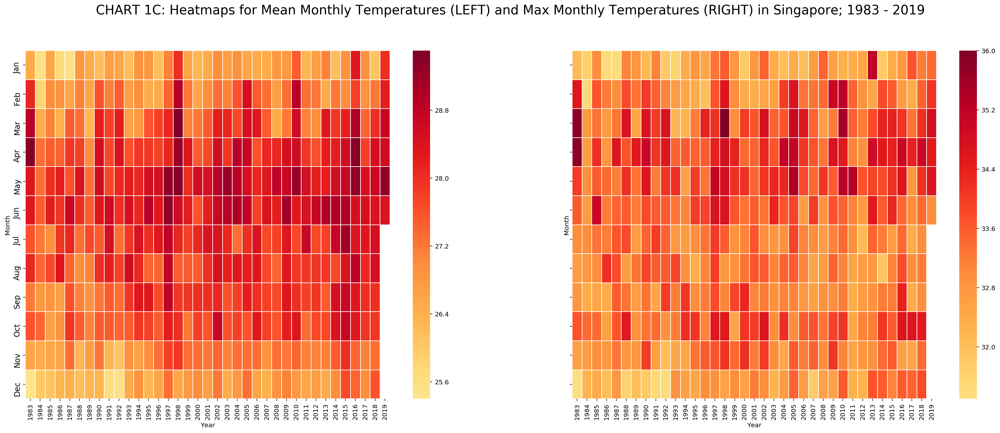

In [63]:
fig, axs = plt.subplots(1, 2, figsize=(28, 10), sharey=True)

sns.heatmap(
    mean_temp,
    linewidths=0.5,
    cmap="YlOrRd",
    center=27,
    ax=axs[0]
    )

sns.heatmap(
    max_temp,
    linewidths=0.5,
    cmap="YlOrRd",
    center=33,
    ax=axs[1]
    )
fig.suptitle("CHART 1C: Heatmaps for Mean Monthly Temperatures (LEFT) and Max Monthly Temperatures (RIGHT) in Singapore; 1983 - 2019", fontsize=20)
axs[0].set_yticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], fontsize=12)
plt.show()

The heatmap on the left, for monthly mean temperaures, depict a clearer trend over the decades, with darker patches towards the right indicating rising average monthly temperatures. The darker patches in the centre also tell you where the hotter months are.

The patterns in the heatmap on the right, for maximum monthly temperatures, are a little harder to read. The darker parts are mostly conentrated around the February-May period, though there's an interesting patch of deep red for October as well in recent years, starting from 2014.

## 2.2 Alternative view: Ridgeline Plots of changes in daily temperatures from 1983 - 2019
I've always loved the sharp, angular look of the ridgeline plots (or joyplots as they were once known) ever since I first came across them in late 2018.

They look awesome, but I'll honestly say that they don't necessarily present the trend as clearly as the simpler Seaborn charts. Give it a try if you are keen to see how you can use it in your own visualisations. Here's [the repo I used](https://github.com/sbebo/joypy/blob/master/joypy/joyplot.py).

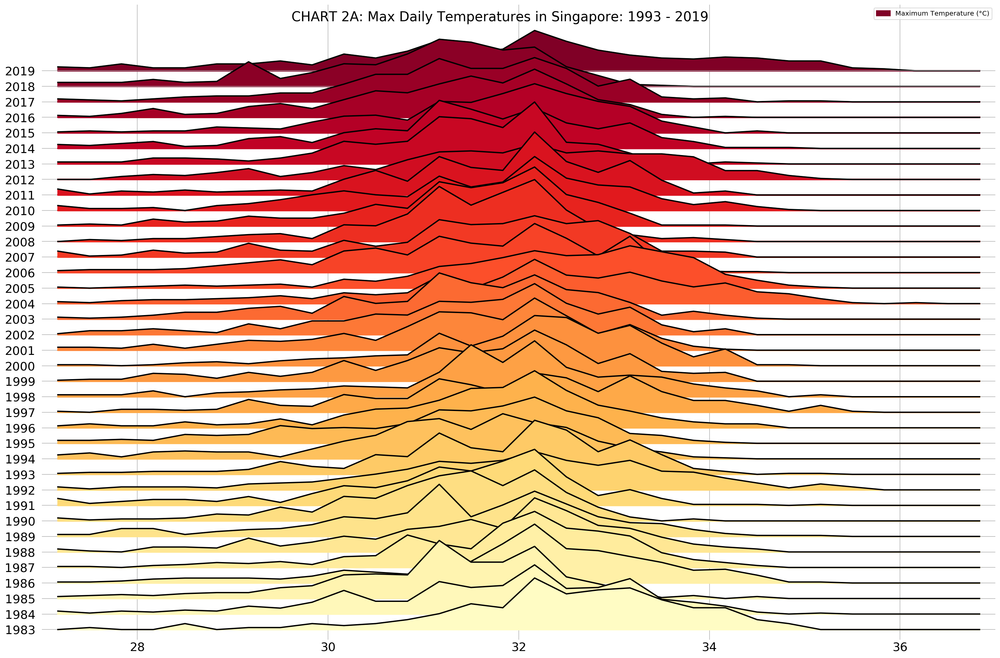

In [65]:
fig, axes = joypy.joyplot(weather, by="Year", column="Maximum Temperature (°C)",
                   kind="normalized_counts", bins=30,
                   range_style='all', x_range=[27, 37],
                   overlap=2, linewidth=2, colormap=cm.YlOrRd_r,
                   legend = True,
                   ylabelsize = 18, xlabelsize = 18, 
                   labels=weather.Year.unique(), grid='both', figsize=(21,14))
fig.suptitle("CHART 2A: Max Daily Temperatures in Singapore: 1993 - 2019", fontsize=20)
plt.show()

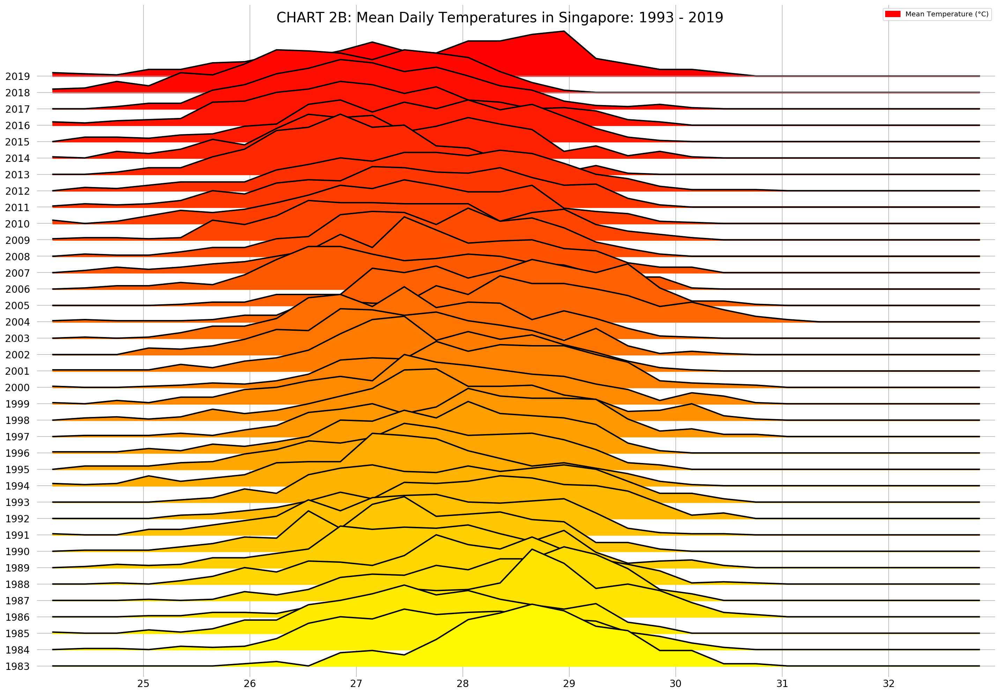

In [64]:
fig, axes = joypy.joyplot(weather, by="Year", column="Mean Temperature (°C)",
                   kind="normalized_counts", bins=30,
                   range_style='all', x_range=[24, 33],
                   overlap=2, linewidth=2, colormap=cm.autumn,
                   legend = True,
                   ylabelsize = 14, xlabelsize = 14, 
                   labels=weather.Year.unique(), grid='both', figsize=(20,14),
                   )
fig.suptitle("CHART 2B: Mean Daily Temperatures in Singapore: 1993 - 2019", fontsize=20)
plt.show()

## 2.3 3D Plots using Plotly Express: Changes in monthly temperatures from 1983 - 2019

The newer visualisation libraries like Plotly Express offer a tonne of new features, including the ability to produce interactive, 3D-animated charts like the ones below. Admittedly, this isn't the clearest or most efficient way to illustrate a trend, but it is visually exciting and adds an interesting new option for presentations when used appropriately. 

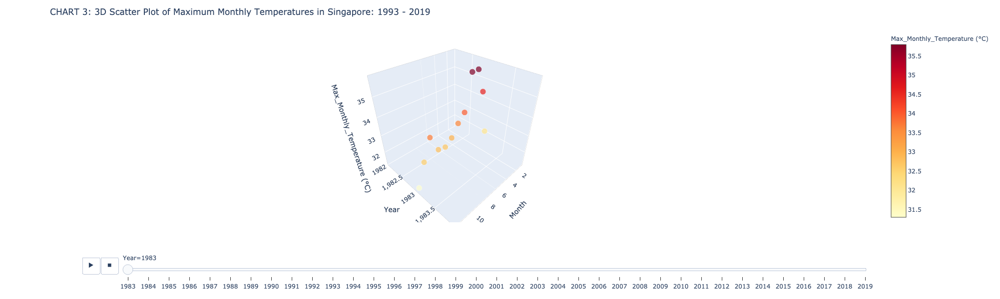

In [24]:
fig = px.scatter_3d(
    temp_max,
    x="Month",
    y="Year",
    z="Max_Monthly_Temperature (°C)",
    color="Max_Monthly_Temperature (°C)",
    size="Max_Monthly_Temperature (°C)",
    hover_name="Year",
    animation_frame="Year",
    animation_group="Year",
    color_continuous_scale=px.colors.sequential.YlOrRd,
)
fig.update_layout(
    title=go.layout.Title(
        text="CHART 3: 3D Scatter Plot of Maximum Monthly Temperatures in Singapore: 1993 - 2019"
    )
)
fig.show()

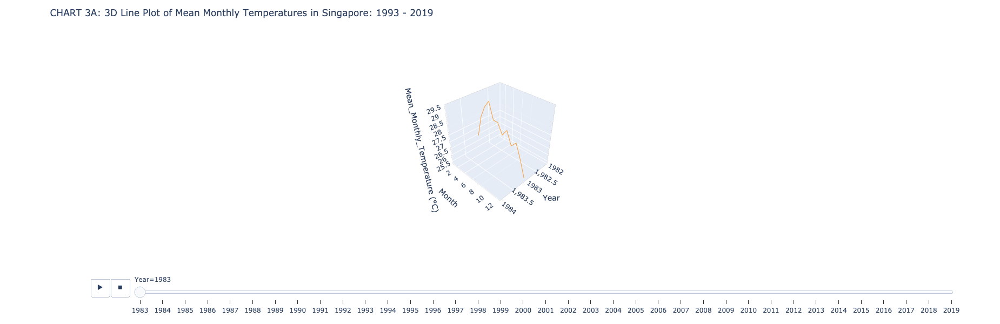

In [83]:
fig = px.line_3d(
    temp_mean,
    x="Year",
    y="Month",
    z="Mean_Monthly_Temperature (°C)",
    hover_name="Year",
    animation_frame="Year",
    animation_group="Year",
    color_discrete_sequence=px.colors.sequential.Plasma[-3::-1])
fig.update_layout(
    title=go.layout.Title(
        text="CHART 3A: 3D Line Plot of Mean Monthly Temperatures in Singapore: 1993 - 2019"
    )
)
fig.show()

# 3. A HARD RAIN'S A-GONNA FALL - VISUALISING DAILY AND MONTHLY RAIN RECORDS
Between Jan 1983 and June 2019, there were 6,399 days of rain and 6,931 dry days - a roughly even-split. With climate change, more intense storms are expected. Let's see if there are already signs of this based on current numbers.

# 3.1: Visualising yearly and monthly rain patterns using Seaborn
Again, let's start with the classic and simpler charts, before experimenting with different ways of visualising the data.

The first chart below is as straightforward as it gets, summing up the annual rainfall and grouping them by years. 1997 and 2015 stuck out as the years with lowest amount of annual rainfall, while 2007 saw the highest amount of yearly rainfall.

But there aren't yet persistent signs of a sharp spike, up or down, in terms of total annual rainfall. Let's take a look at the data at a more granular level.

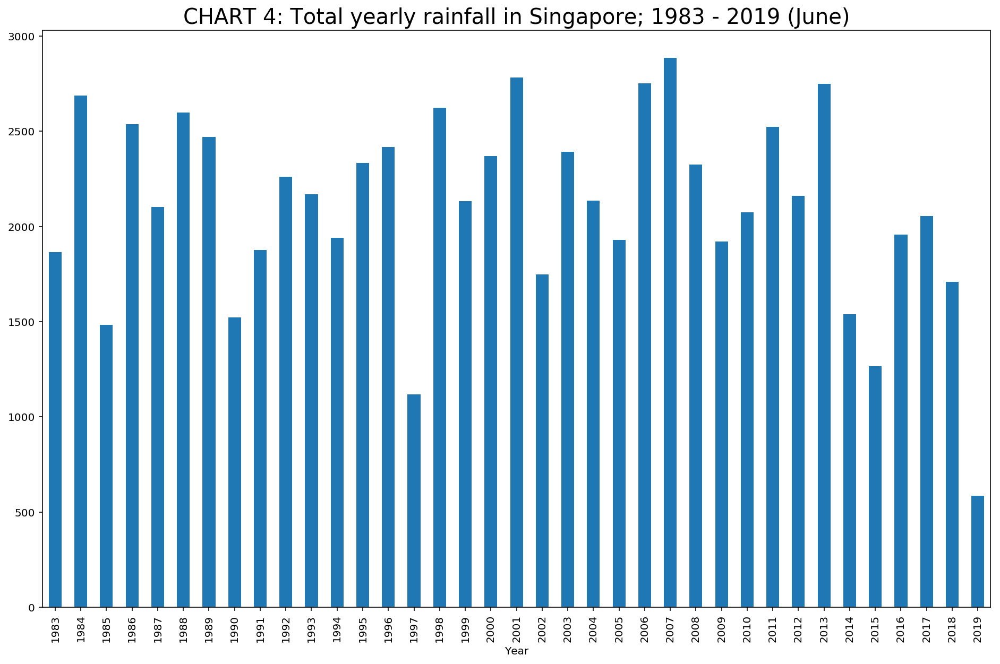

In [84]:
# Yearly rainfall pattern
weather.groupby(
    ["Year"]
)['Daily Rainfall Total (mm)'].sum().plot(kind="bar", figsize=(16, 10))
plt.title('CHART 4: Total yearly rainfall in Singapore; 1983 - 2019 (June)', fontsize=20)
plt.show()

For the second chart on rainfall records, I decided to break a few minor rules along the way and reversed the y-axis to simulate the look of falling rain. I'm not sure if this is frowned upon in "proper" data visualisation, but I feel that this a  visualling appealing way to present the data that is also organic to the nature of the data.

At a glance, you can tell where the outliers are in terms of unusual amounts of rain on a daily or monthly level. But the lack of interactivity is a problem with charts like these, where you want to be able to call up the specific information by hovering over a point of interest. Annotating the charts would be too messy in this case. The Plotly charts come in handy for such situations, as we will see later. 

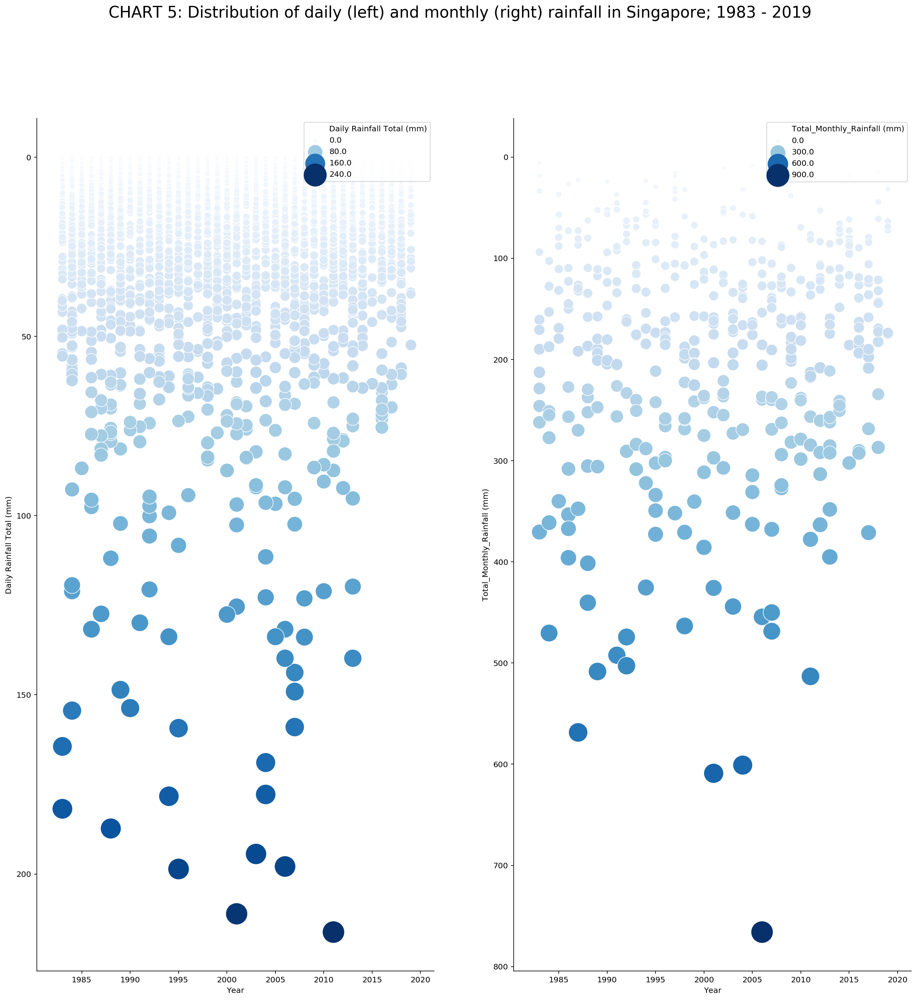

In [27]:
fig, axs = plt.subplots(1, 2, figsize=(20, 20), sharex=True)
ax = sns.scatterplot(
    x="Year",
    y="Daily Rainfall Total (mm)",
    data=weather,
    hue="Daily Rainfall Total (mm)",
    size = "Daily Rainfall Total (mm)",
    sizes=(20, 800),
    palette="Blues",
    ax=axs[0]
)
sns.scatterplot(
    x="Year",
    y="Total_Monthly_Rainfall (mm)",
    data=monthly_rain,
    hue="Total_Monthly_Rainfall (mm)",
    size = "Total_Monthly_Rainfall (mm)",
    sizes=(20, 800),
    palette="Blues",
    ax=axs[1]
)
axs[0].invert_yaxis()
axs[1].invert_yaxis()
axs[0].legend(loc='upper right')
axs[1].legend(loc='upper right')
fig.suptitle("CHART 5: Distribution of daily (left) and monthly (right) rainfall in Singapore; 1983 - 2019", fontsize=20)
sns.despine()
plt.show()

## 3.1.1 CHECKING ON DETAILS OF THE DAYS/MONTHS WITH UNUSUALLY HEAVY RAIN
One draw back of the classic Seaborn charts is that you'll have to manually find out specific values of interest, in this case, the days and months with abnormal amounts of rain. 

In [30]:
weather['Daily Rainfall Total (mm)'].max(), weather['Daily Rainfall Total (mm)'].mean()

(216.2, 5.85190547636907)

In [31]:
weather[weather['Daily Rainfall Total (mm)'] == 216.2]

,Date,Year,Month,Day,Daily Rainfall Total (mm),Mean Temperature (°C),Maximum Temperature (°C),Minimum Temperature (°C),Mean Wind Speed (km/h),Max Wind Speed (km/h)
3073,2011-01-30,2011,1,30,216.2,23.6,25.0,21.6,6.6,34.9


Jan 30 2011 had the heaviest single day of rainfall in the last 36 days. In fact, according to the [Met Service's review of the weather in 2011](https://www.nea.gov.sg/corporate-functions/resources/publications/annual-reports/annual-weather-review-2011), that was "the highest ever rainfall in a day for the month of January since records began in 1869". 

In [32]:
monthly_rain['Total_Monthly_Rainfall (mm)'].max(), monthly_rain['Total_Monthly_Rainfall (mm)'].mean()

(765.9, 178.35045662100472)

In [33]:
monthly_rain[monthly_rain['Total_Monthly_Rainfall (mm)'] == 765.9]

,Total_Monthly_Rainfall (mm),Year,Month
287,765.9,2006,12


December 2006 had the heaviest monthly rainfall in this dataset.

Next, I'm curious about whether we've been seening more days of unusually heavy rain in recent years. But the tricky thing is defining what counts as "unusually heavy rain". In this case, I'm not sure if a statistical definition makes sense in the context of meteorological data.

For simplicity, I'm setting the cut-off at 100m of rainfall in a day, which is about 20 times that of the daily average rainfall.

In [34]:
intense_rain = weather[weather['Daily Rainfall Total (mm)'] > 100]
intense_rain.head()

,Date,Year,Month,Day,Daily Rainfall Total (mm),Mean Temperature (°C),Maximum Temperature (°C),Minimum Temperature (°C),Mean Wind Speed (km/h),Max Wind Speed (km/h)
2035,2013-12-03,2013,12,3,119.8,25.6,30.6,23.5,5.7,27.4
2085,2013-10-14,2013,10,14,139.8,27.4,30.3,23.2,5.6,28.8
3073,2011-01-30,2011,1,30,216.2,23.6,25.0,21.6,6.6,34.9
3271,2010-07-16,2010,7,16,121.1,27.4,30.8,23.9,6.0,37.1
3979,2008-08-07,2008,8,7,133.9,27.0,31.8,22.6,10.1,48.6


In [35]:
intense_rain['Year'].value_counts().sort_index(ascending=True)

1983    2
1984    3
1986    1
1987    1
1988    2
1989    2
1990    1
1991    1
1992    3
1994    2
1995    3
2000    1
2001    3
2003    1
2004    4
2005    1
2006    3
2007    4
2008    2
2010    1
2011    1
2013    2
Name: Year, dtype: int64

If we are going by decades, the 80s had 11 days where the daily rainfall exceeded 100mm, while the 90s and 00s had 10 and 18 days respectively. This decade has seen only(?) 4 days of rainfall above 100mm in a 24-hour period.

The picture would probably look quite different if we change up the definition of "unusually heavy rain". But that's something outside of this exercise.

## 3.1.2 Bar Chart Race
Bar chart races have become quite popular on social media of late. I attempted one [here](https://public.flourish.studio/visualisation/578188/). The data required a minor tweak, as shown below:

I can see why charts like this do well on social media. But it's questionable as to whether they are really effective in communicating trends.

In [ ]:
rain_race = pd.pivot_table(monthly_rain, index="Year", values="Total_Monthly_Rainfall (mm)", columns="Month")
#rain_race.to_csv('../output/rain_race.csv')

## 3.2 Interactive plots using Plotly Express: Daily and monthly rain patterns
Plotly Express' interactive features make it easier to get individual values from the charts - all you need is to hover the point of interest. But it's harder to manipulate them as subplots, and embedding fully interactive charts on sites like Medium continue to be a challenge.

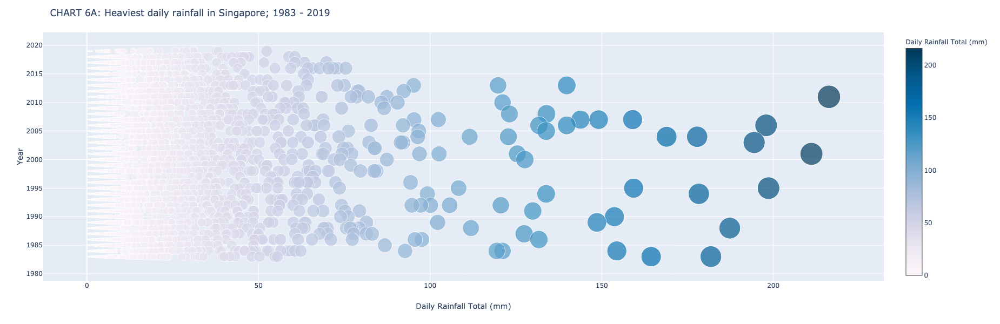

In [36]:
# Same chart(s) as Chart 5 (left) above, but rendered on Plotly Express
fig = px.scatter(
    weather,
    x="Daily Rainfall Total (mm)",
    y="Year",
    size="Daily Rainfall Total (mm)",
    color="Daily Rainfall Total (mm)",
    hover_name="Date",
    size_max=30,
    color_continuous_scale=px.colors.sequential.PuBu
)
fig.update_layout(
    title=go.layout.Title(
        text="CHART 6A: Heaviest daily rainfall in Singapore; 1983 - 2019"
    )
)
fig.show()


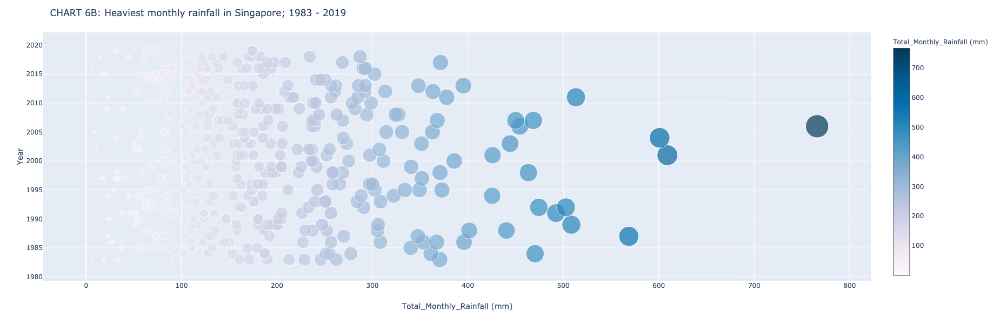

In [38]:
# Same chart(s) as Chart 5 (right) above, but rendered on Plotly Express
fig = px.scatter(
    monthly_rain,
    x="Total_Monthly_Rainfall (mm)",
    y="Year",   
    size="Total_Monthly_Rainfall (mm)",
    color="Total_Monthly_Rainfall (mm)",
    hover_name="Month",
    size_max=30,
    color_continuous_scale=px.colors.sequential.PuBu
)
fig.update_layout(
    title=go.layout.Title(
        text="CHART 6B: Heaviest monthly rainfall in Singapore; 1983 - 2019"
    )
)
fig.show()

# 4. WHEN THE WIND BLOWS
Wind speeds don't get much attention in Singapore due to its geographical location, which shields the island from severe storms like tropical cyclones. But it's still interesting to take a quick look at historical patterns for wind data for signs of potential changes.

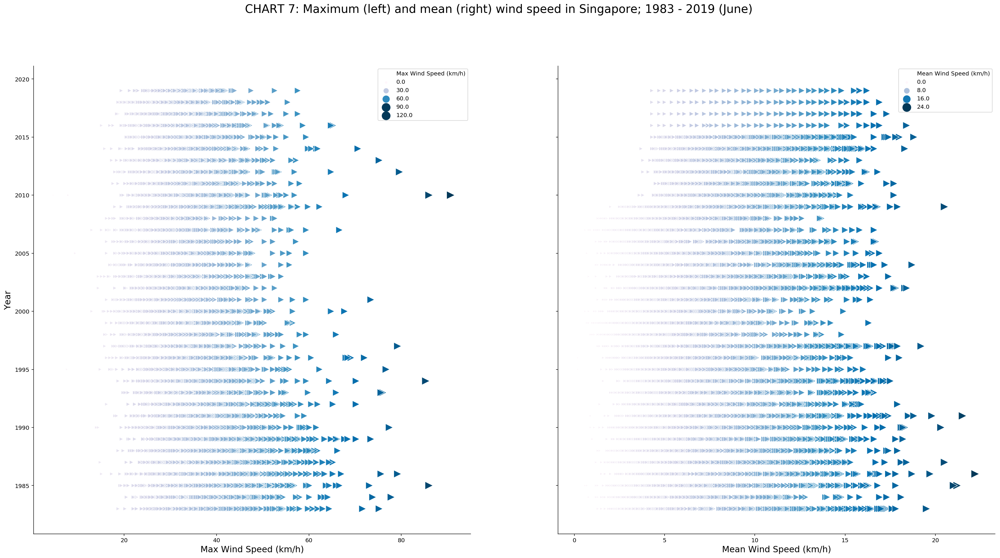

In [96]:
fig, axs = plt.subplots(1, 2, figsize=(30, 15), sharey=True)
sns.scatterplot(
    x="Max Wind Speed (km/h)",
    y="Year",
    data=weather,
    marker=">",
    sizes=(10, 200),
    size="Max Wind Speed (km/h)",
    hue="Max Wind Speed (km/h)",
    palette="PuBu",
    ax=axs[0]
)
sns.scatterplot(
    x="Mean Wind Speed (km/h)",
    y="Year",
    data=weather,
    marker=">",
    sizes=(10, 200),
    size="Mean Wind Speed (km/h)",
    hue="Mean Wind Speed (km/h)",
    palette="PuBu",
    ax=axs[1]
)
fig.suptitle("CHART 7: Maximum (left) and mean (right) wind speed in Singapore; 1983 - 2019 (June)", fontsize=20)
axs[0].set_ylabel("Year", fontsize=15)
axs[0].set_xlabel("Max Wind Speed (km/h)", fontsize=15)
axs[1].set_xlabel("Mean Wind Speed (km/h)", fontsize=15)
sns.despine()
plt.show()

In [91]:
weather[weather['Max Wind Speed (km/h)'] == 90.7]

,Date,Year,Month,Day,Daily Rainfall Total (mm),Mean Temperature (°C),Maximum Temperature (°C),Minimum Temperature (°C),Mean Wind Speed (km/h),Max Wind Speed (km/h)
3135,2010-11-29,2010,11,29,30.2,26.3,31.8,23.5,5.8,90.7


In [98]:
weather['Max Wind Speed (km/h)'].mean()

34.04172235152776

The chart on the right suggests that average wind speeds in Singapore haven't picked up much over the decades. On the left chart, it's interesting to see a small series of strong wind gusts recorded from 2010.

The strongest wind gust recorded in the last 36 years was on Nov 29 2010, when the maximum wind speed hit 90.7km/h - about 2.6 times the average maximum wind speed recorded in this period.

## 4.1 Wind and Rain
We naturally associate strong winds with heavy rain as well. Let's see how the two conditions vary over the years: The bigger triangles indicate a higher amount of rain, and those with a darker shade are more recent whereas triangles with a ligher shade reflect earlier records.

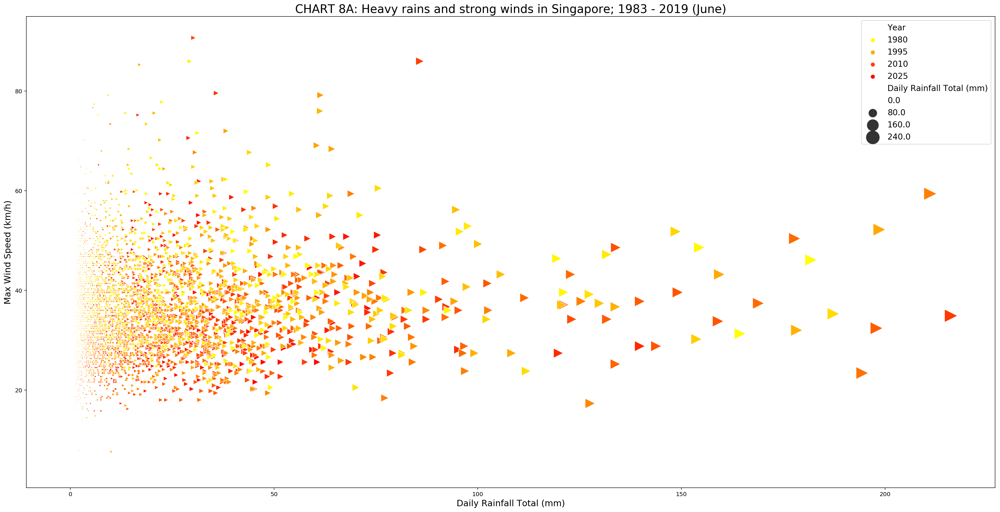

In [123]:
plt.figure(figsize=(30, 15))
sns.scatterplot(
    x="Daily Rainfall Total (mm)",
    y="Max Wind Speed (km/h)",
    data=weather,
    marker=">",
    sizes=(0, 500),
    size="Daily Rainfall Total (mm)",
    hue="Year",
    palette="autumn_r",
)
plt.title("CHART 8A: Heavy rains and strong winds in Singapore; 1983 - 2019 (June)", fontsize=20)
plt.ylabel("Max Wind Speed (km/h)", fontsize=15)
plt.xlabel("Daily Rainfall Total (mm)", fontsize=15)
plt.legend(prop={'size':14})
plt.show()


Again, Plotly Express comes in handy for reproducing a similar chart as above, but allowing for individual values to be called up quickly with its interactive features.

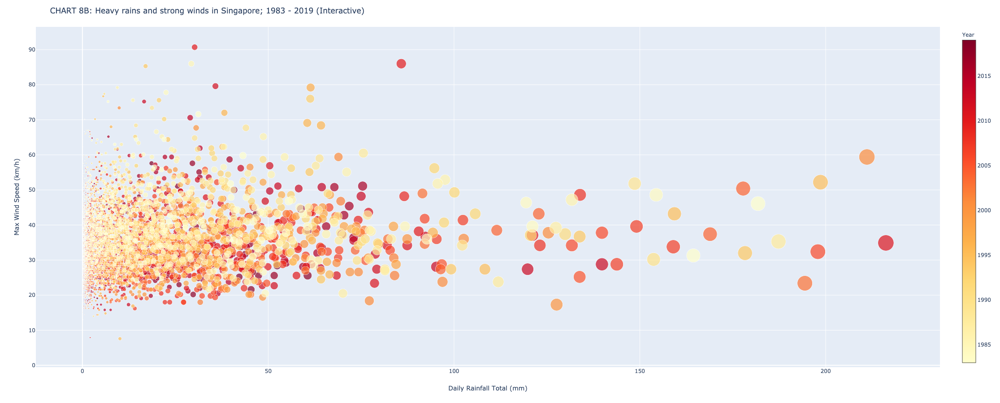

In [139]:
fig = px.scatter(
    weather,
    x="Daily Rainfall Total (mm)",
    y="Max Wind Speed (km/h)",
    color="Year",
    size="Daily Rainfall Total (mm)",
    hover_name="Date",
    size_max=25,
    color_continuous_scale=px.colors.sequential.YlOrRd,
)
fig.update_layout(
    title=go.layout.Title(
        text="CHART 8B: Heavy rains and strong winds in Singapore; 1983 - 2019 (Interactive)"
    ),
    autosize=False,
    width=2200,
    height=900
)
fig.show()

# 5. BREAKDOWN COMPARISON

If you want to break the weather data down into a matrix of panels according to month and day, Plotly Express has a neat feature for that.

Here, I plot out four such matrices for weather records in 1988, 1998, 2008, and 2018 for a comparison of temperature-rainfall patterns over four decades. The larger and bigger circles point to heavier downpours. Hover over individual points for fuller data. To zoom in on a particular area of interest, just click and drag over the chart. 

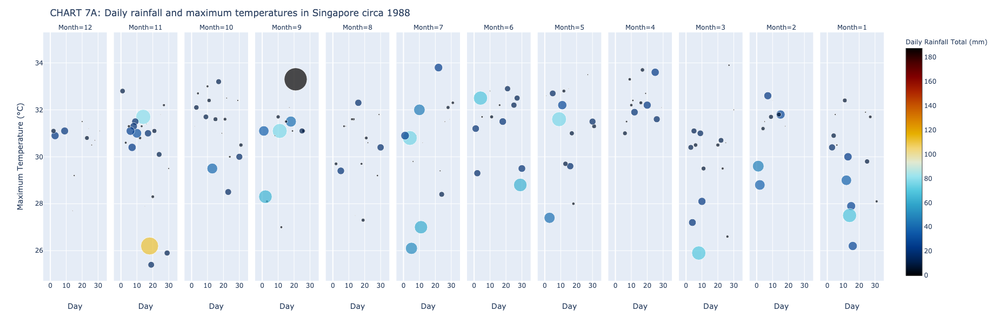

In [147]:
fig = px.scatter(
    weather.query("Year==1988"),
    x="Day",
    y="Maximum Temperature (°C)",
    size="Daily Rainfall Total (mm)",
    color="Daily Rainfall Total (mm)",
    size_max = 30,
    hover_name="Date",
    facet_col="Month",
    color_continuous_scale=px.colors.cyclical.IceFire,
)
fig.update_layout(
    title=go.layout.Title(
        text="CHART 9A: Daily rainfall and maximum temperatures in Singapore circa 1988"
    )
)
fig.show()

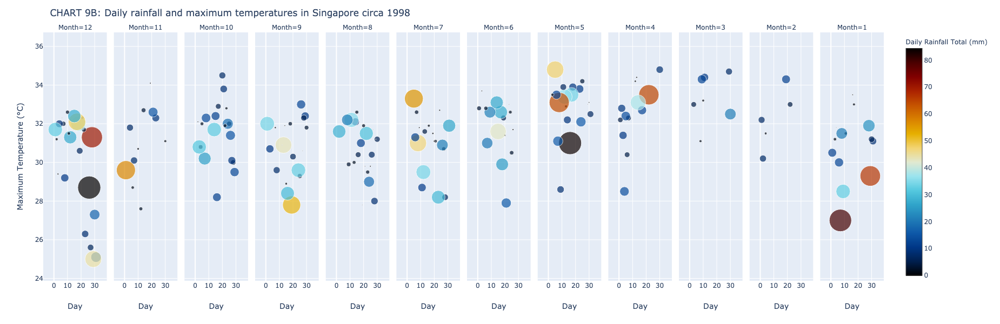

In [153]:
fig = px.scatter(
    weather.query("Year==1998"),
    x="Day",
    y="Maximum Temperature (°C)",
    size="Daily Rainfall Total (mm)",
    color="Daily Rainfall Total (mm)",
    size_max = 30,
    hover_name="Date",
    facet_col="Month",
    color_continuous_scale=px.colors.cyclical.IceFire,
)
fig.update_layout(
    title=go.layout.Title(
        text="CHART 9B: Daily rainfall and maximum temperatures in Singapore circa 1998"
    )
)
fig.show()

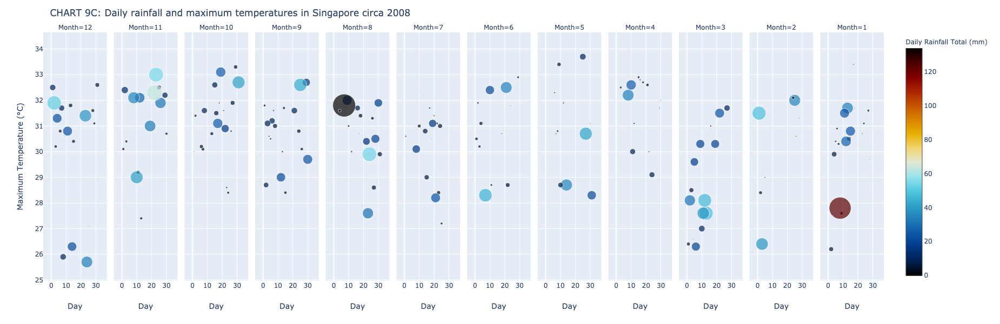

In [154]:
fig = px.scatter(
    weather.query("Year==2008"),
    x="Day",
    y="Maximum Temperature (°C)",
    size="Daily Rainfall Total (mm)",
    color="Daily Rainfall Total (mm)",
    size_max = 30,
    hover_name="Date",
    facet_col="Month",
    color_continuous_scale=px.colors.cyclical.IceFire,
)
fig.update_layout(
    title=go.layout.Title(
        text="CHART 9C: Daily rainfall and maximum temperatures in Singapore circa 2008"
    )
)
fig.show()

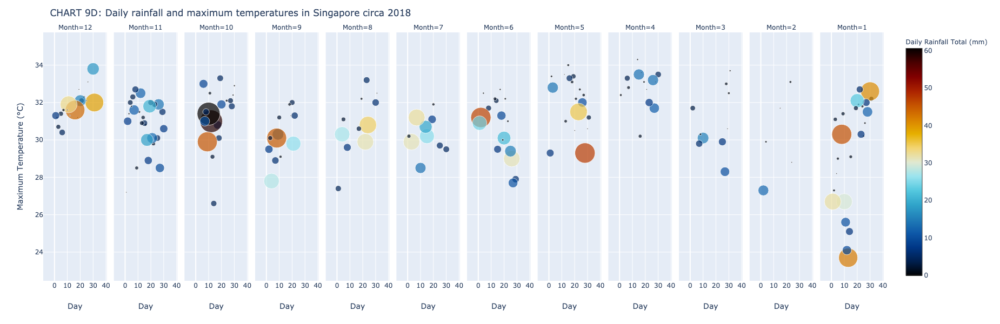

In [155]:
fig = px.scatter(
    weather.query("Year==2018"),
    x="Day",
    y="Maximum Temperature (°C)",
    size="Daily Rainfall Total (mm)",
    color="Daily Rainfall Total (mm)",
    size_max = 30,
    hover_name="Date",
    facet_col="Month",
    color_continuous_scale=px.colors.cyclical.IceFire,
)
fig.update_layout(
    title=go.layout.Title(
        text="CHART 9D: Daily rainfall and maximum temperatures in Singapore circa 2018"
    )
)
fig.show()

The visualisation possibilities are endles. If you come up with your own using the same dataset, do share them with me @

Twitter: @chinhon

LinkedIn: https://www.linkedin.com/in/chuachinhon/